Road Accident Risk Prediction using XGBoost

Based on the Kaggle competition:

**Predicting Road Accident Risk**

Author: Alaa Motawe

Purpose: Learning & Portfolio


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s5e10/sample_submission.csv
/kaggle/input/playground-series-s5e10/train.csv
/kaggle/input/playground-series-s5e10/test.csv


In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
file_path="/kaggle/input/playground-series-s5e10/train.csv"


In [ ]:
df=pd.read_csv(file_path)

In [ ]:
df.shape

(517754, 14)

In [ ]:
df.head()

,id,road_type,num_lanes,curvature,speed_limit,lighting,weather,road_signs_present,public_road,time_of_day,holiday,school_season,num_reported_accidents,accident_risk
0,0,urban,2,0.06,35,daylight,rainy,False,True,afternoon,False,True,1,0.13
1,1,urban,4,0.99,35,daylight,clear,True,False,evening,True,True,0,0.35
2,2,rural,4,0.63,70,dim,clear,False,True,morning,True,False,2,0.30
3,3,highway,4,0.07,35,dim,rainy,True,True,morning,False,False,1,0.21
4,4,rural,1,0.58,60,daylight,foggy,False,False,evening,True,False,1,0.56


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517754 entries, 0 to 517753
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   id                      517754 non-null  int64  
 1   road_type               517754 non-null  object 
 2   num_lanes               517754 non-null  int64  
 3   curvature               517754 non-null  float64
 4   speed_limit             517754 non-null  int64  
 5   lighting                517754 non-null  object 
 6   weather                 517754 non-null  object 
 7   road_signs_present      517754 non-null  bool   
 8   public_road             517754 non-null  bool   
 9   time_of_day             517754 non-null  object 
 10  holiday                 517754 non-null  bool   
 11  school_season           517754 non-null  bool   
 12  num_reported_accidents  517754 non-null  int64  
 13  accident_risk           517754 non-null  float64
dtypes: bool(4), float64(

In [ ]:
df=df.drop(columns=['id'])

In [ ]:
#after delet id column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517754 entries, 0 to 517753
Data columns (total 13 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   road_type               517754 non-null  object 
 1   num_lanes               517754 non-null  int64  
 2   curvature               517754 non-null  float64
 3   speed_limit             517754 non-null  int64  
 4   lighting                517754 non-null  object 
 5   weather                 517754 non-null  object 
 6   road_signs_present      517754 non-null  bool   
 7   public_road             517754 non-null  bool   
 8   time_of_day             517754 non-null  object 
 9   holiday                 517754 non-null  bool   
 10  school_season           517754 non-null  bool   
 11  num_reported_accidents  517754 non-null  int64  
 12  accident_risk           517754 non-null  float64
dtypes: bool(4), float64(2), int64(3), object(4)
memory usage: 37.5+ MB


In [ ]:
print(df.duplicated().sum())

656


In [ ]:
df.describe()

,num_lanes,curvature,speed_limit,num_reported_accidents,accident_risk
count,517754.000000,517754.000000,517754.000000,517754.000000,517754.000000
mean,2.491511,0.488719,46.112575,1.187970,0.352377
std,1.120434,0.272563,15.788521,0.895961,0.166417
min,1.000000,0.000000,25.000000,0.000000,0.000000
25%,1.000000,0.260000,35.000000,1.000000,0.230000
50%,2.000000,0.510000,45.000000,1.000000,0.340000
75%,3.000000,0.710000,60.000000,2.000000,0.460000
max,4.000000,1.000000,70.000000,7.000000,1.000000


In [ ]:
for col in df.columns:
    unique_values = df[col].unique()
    print(f"Column '{col}' has {len(unique_values)} unique values:")
    print(unique_values)
    print("-"*50)

Column 'road_type' has 3 unique values:
['urban' 'rural' 'highway']
--------------------------------------------------
Column 'num_lanes' has 4 unique values:
[2 4 1 3]
--------------------------------------------------
Column 'curvature' has 261 unique values:
[0.06     0.99     0.63     0.07     0.58     0.54     0.04     0.33
 0.38     0.45     0.26     0.84     0.14     0.08     0.52     0.35
 0.68     0.72     0.86     0.17     0.16     0.41     0.49     0.39
 0.7      0.12     0.95     0.01     0.1      0.24     0.56     0.53
 0.29     0.73     0.67     0.6      0.57     0.42     0.75     0.61
 0.98     0.05     0.44     0.3907   0.31     0.83     0.46     0.23
 0.87     0.32     0.55     0.65     0.03     0.66     0.37     0.09
 0.13     0.76     0.28     1.       0.43     0.9      0.34     0.02
 0.64     0.79     0.47     0.71     0.36     0.78     0.82     0.18
 0.81     0.25     0.15     0.22     0.85     0.59     0.21     0.5
 0.51     0.92     0.77     0.74     0.27     0.2

In [ ]:
print(df[['curvature', 'accident_risk']].corr())
print('------------------------------------------')
print(df[['num_reported_accidents', 'accident_risk']].corr())
print('------------------------------------------')
print(df[['speed_limit', 'accident_risk']].corr())
print('------------------------------------------')
print(df[['num_lanes', 'accident_risk']].corr())

               curvature  accident_risk
curvature       1.000000       0.543946
accident_risk   0.543946       1.000000
------------------------------------------
                        num_reported_accidents  accident_risk
num_reported_accidents                1.000000       0.213891
accident_risk                         0.213891       1.000000
------------------------------------------
               speed_limit  accident_risk
speed_limit       1.000000       0.430898
accident_risk     0.430898       1.000000
------------------------------------------
               num_lanes  accident_risk
num_lanes       1.000000      -0.006003
accident_risk  -0.006003       1.000000


**<------------Visualisation---------->**


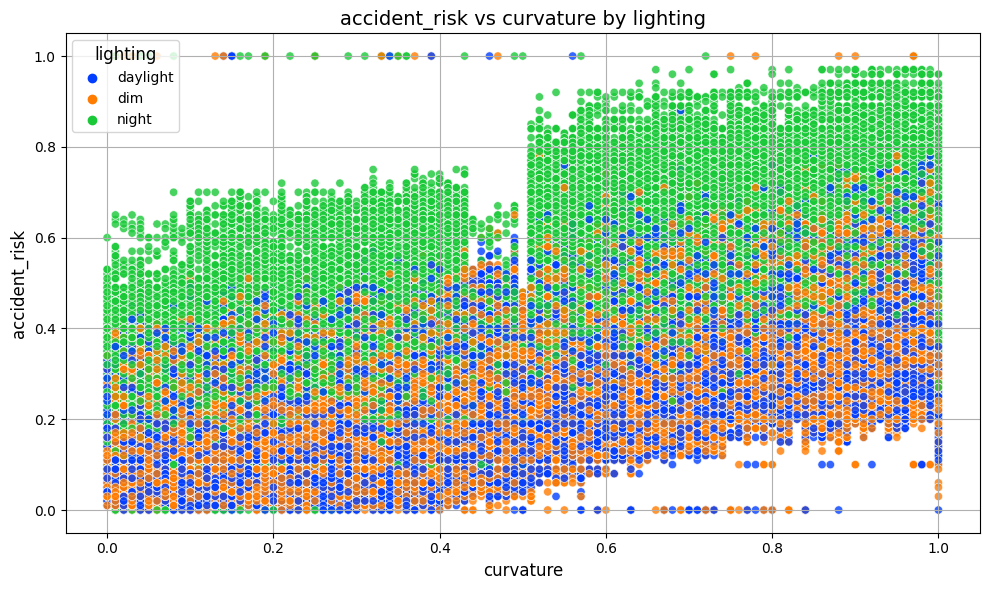

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['lighting'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by lighting', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='lighting', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

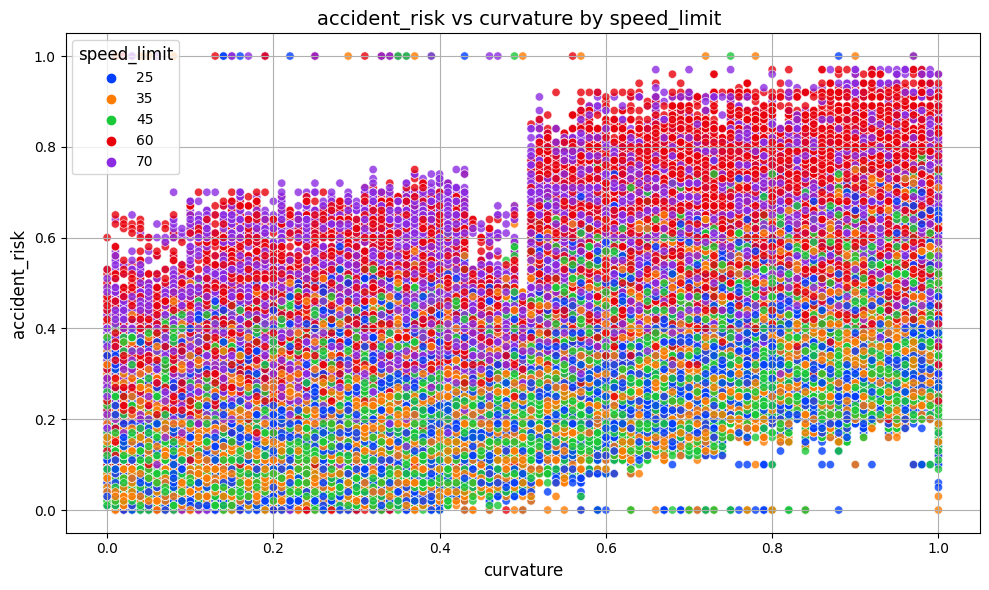

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['speed_limit'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by speed_limit ', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='speed_limit', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

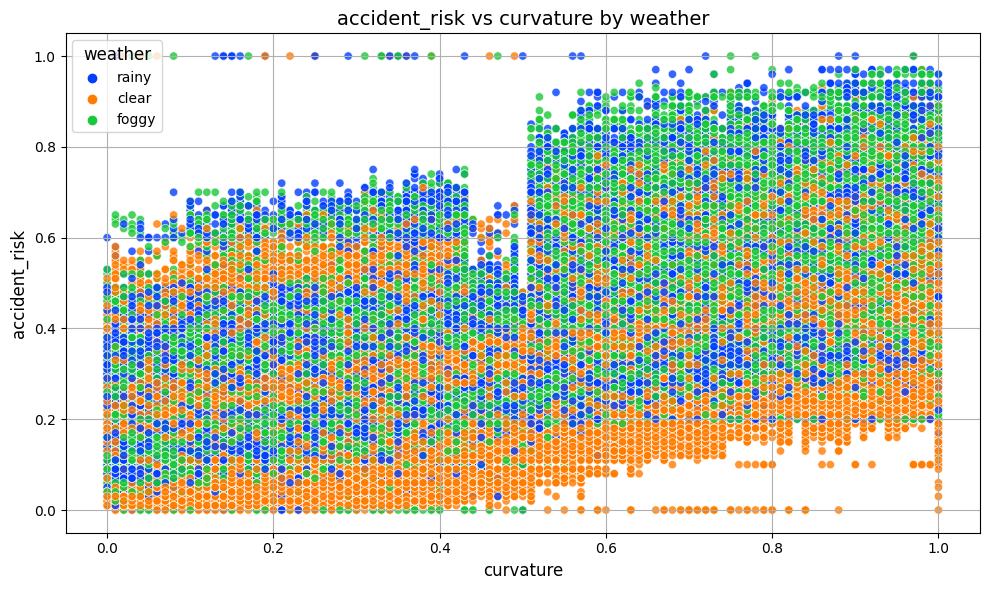

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['weather'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by weather', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='weather', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

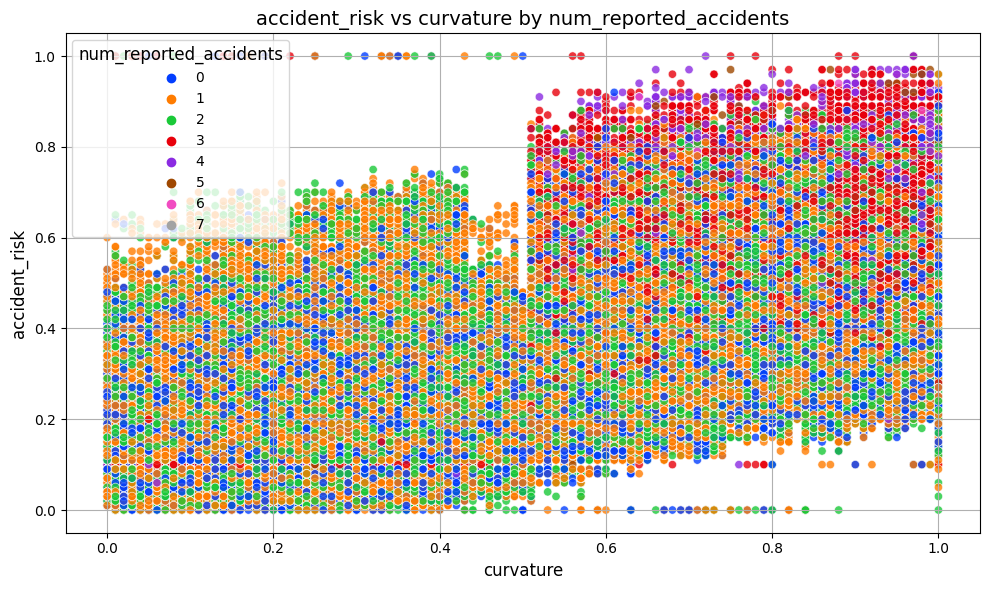

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['num_reported_accidents'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by num_reported_accidents', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='num_reported_accidents', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

**<------------Visualisation--- 2  ------->**

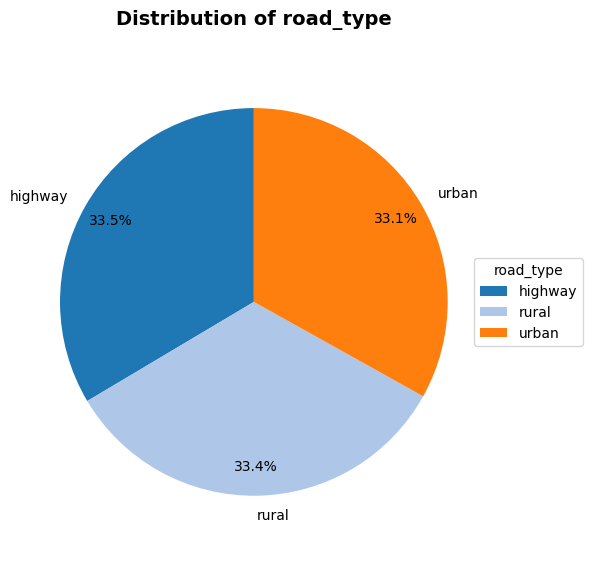

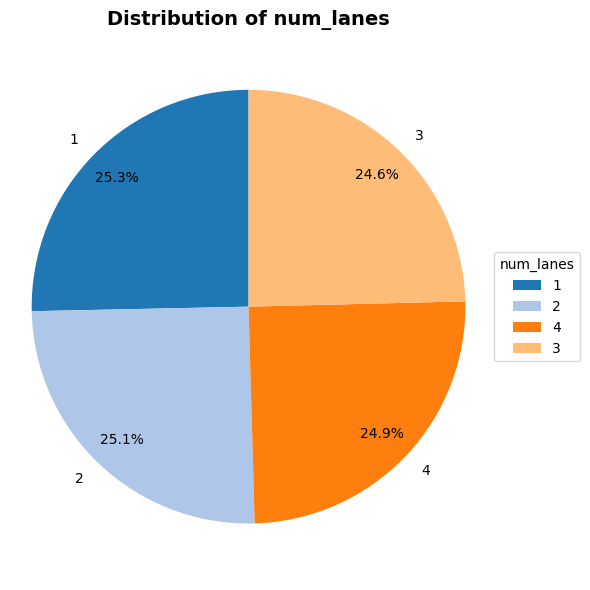

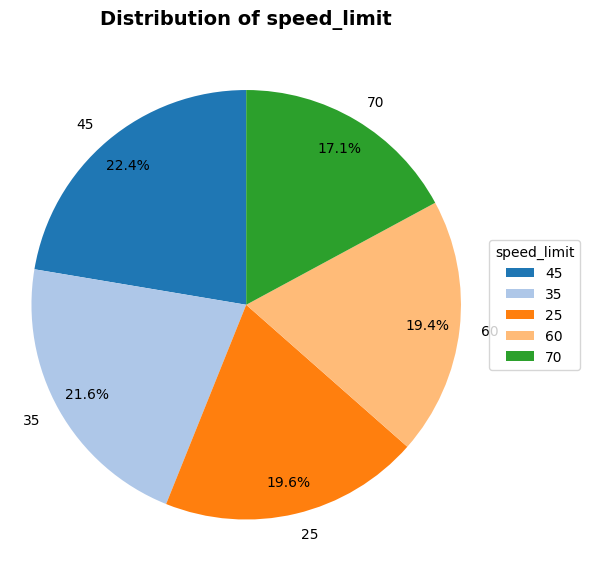

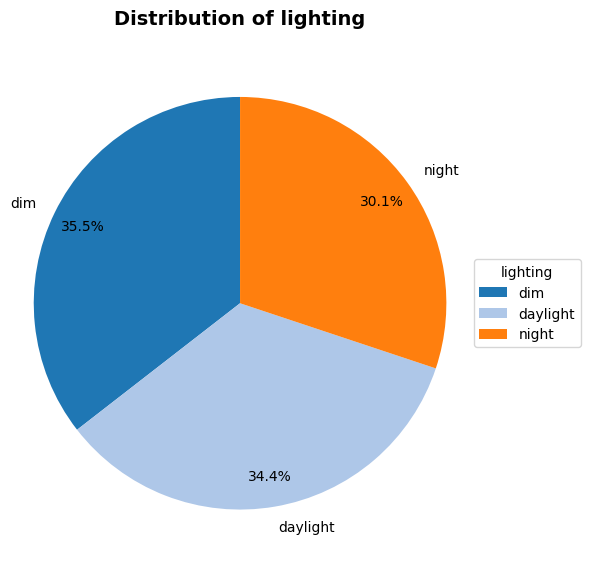

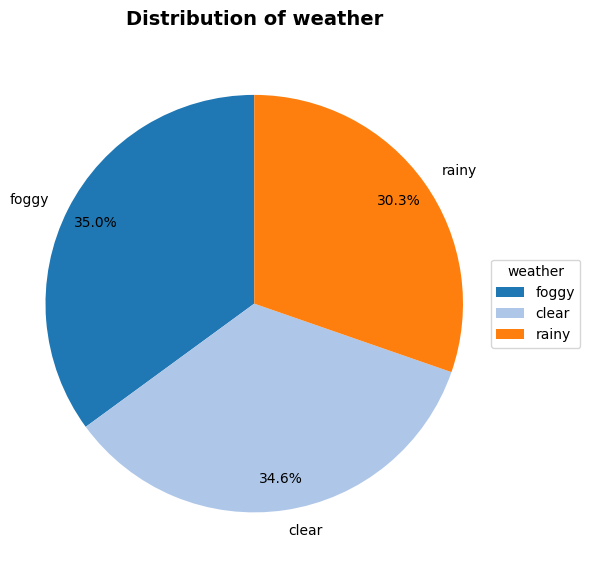

...

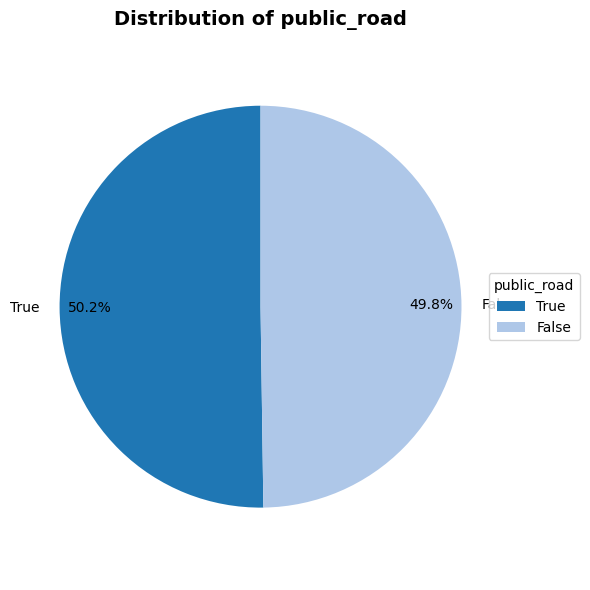

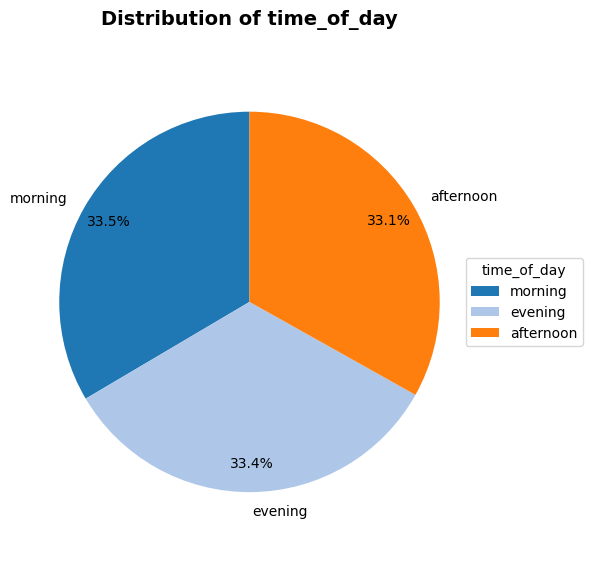

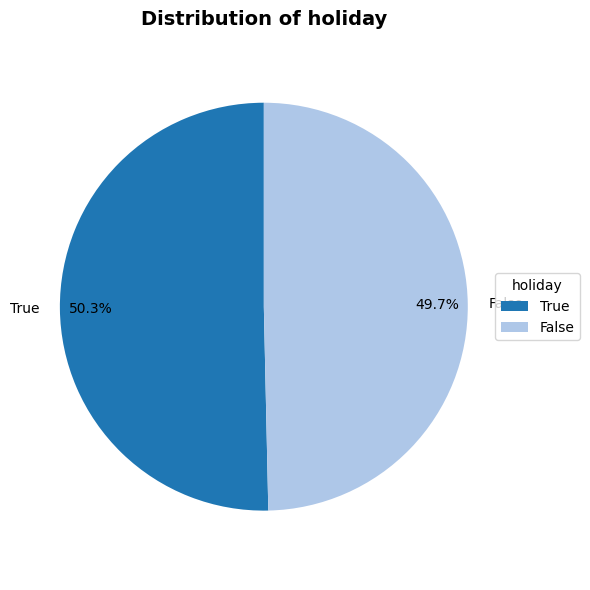

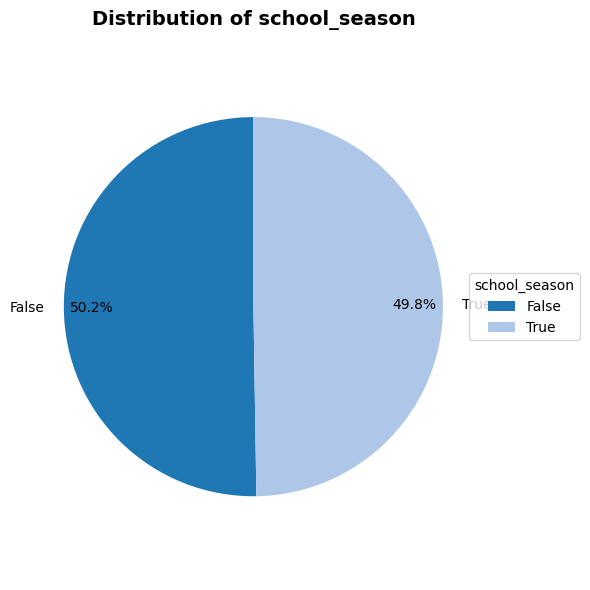

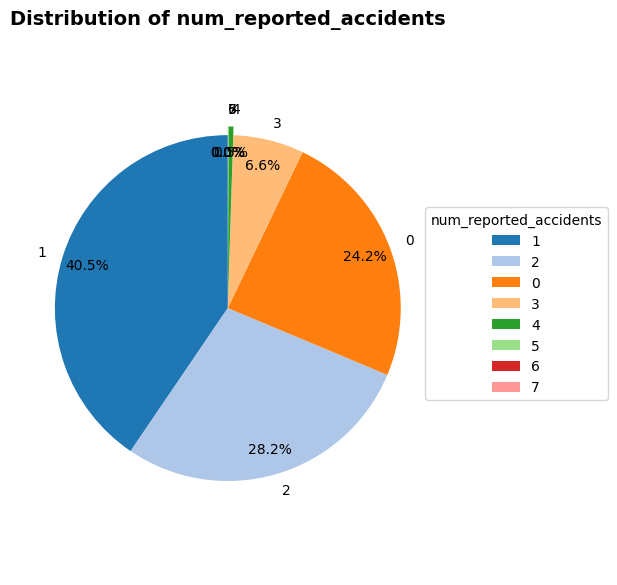

In [ ]:
import matplotlib.pyplot as plt


categorical_columns = [
    'road_type', 'num_lanes', 'speed_limit', 'lighting',
    'weather', 'road_signs_present', 'public_road',
    'time_of_day', 'holiday', 'school_season', 'num_reported_accidents'
]

for col in categorical_columns:

    counts = df[col].value_counts()
    labels = counts.index.tolist()
    sizes = counts.values.tolist()


    colors = plt.cm.tab20.colors[:len(labels)]
    explode = [0.05 if size < max(sizes)*0.1 else 0 for size in sizes]

    fig, ax = plt.subplots(figsize=(6, 6))
    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        explode=explode,
        pctdistance=0.85,
        textprops={'fontsize': 10},
    )

    ax.axis('equal')
    plt.title(f'Distribution of {col}', fontsize=14, weight='bold')
    ax.legend(wedges, labels, title=col, loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
    plt.tight_layout()
    plt.show()


In [ ]:
# List of categorical columns
categorical_columns = [
    'road_type', 'num_lanes', 'speed_limit', 'lighting',
    'weather', 'road_signs_present', 'public_road',
    'time_of_day', 'holiday', 'school_season', 'num_reported_accidents'
]

for col in categorical_columns:
    print(f"Column '{col}' frequency count:")
    print(df[col].value_counts())  # Count occurrences of each unique value
    print('-'*50)


Column 'road_type' frequency count:
road_type
highway    173672
rural      172719
urban      171363
Name: count, dtype: int64
--------------------------------------------------
Column 'num_lanes' frequency count:
num_lanes
1    131168
2    130054
4    129118
3    127414
Name: count, dtype: int64
--------------------------------------------------
Column 'speed_limit' frequency count:
speed_limit
45    115752
35    111628
25    101422
60    100304
70     88648
Name: count, dtype: int64
--------------------------------------------------
Column 'lighting' frequency count:
lighting
dim         183826
daylight    178015
night       155913
Name: count, dtype: int64
--------------------------------------------------
Column 'weather' frequency count:
weather
foggy    181463
clear    179306
rainy    156985
Name: count, dtype: int64
--------------------------------------------------
Column 'road_signs_present' frequency count:
road_signs_present
False    259289
True     258465
Name: count, dtype:

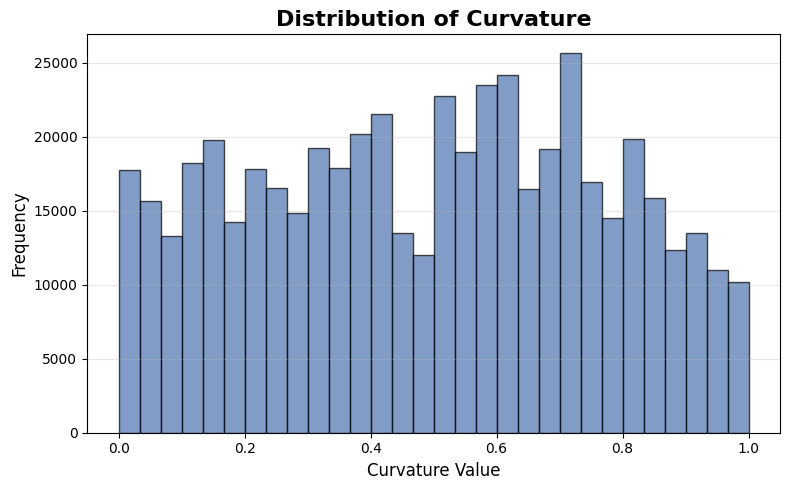

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.hist(df['curvature'], bins=30, color='#4C72B0', edgecolor='black', alpha=0.7)
plt.title('Distribution of Curvature', fontsize=16, weight='bold')
plt.xlabel('Curvature Value', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()



**The distribution of curvature is approximately uniform across different values.This indicates that the data includes both straight and curved roads without bias toward one type.**
#

In [ ]:
print(df.columns)


Index(['road_type', 'num_lanes', 'curvature', 'speed_limit', 'lighting',
       'weather', 'road_signs_present', 'public_road', 'time_of_day',
       'holiday', 'school_season', 'num_reported_accidents', 'accident_risk'],
      dtype='object')


**<-----------------**Split training data into train and validation**---------------->**

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

train =df

# Split data into train and validation
X = train.drop('accident_risk', axis=1)
y = train['accident_risk']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Encode categorical columns
categorical_columns = X_train.select_dtypes(include=['object']).columns
for col in categorical_columns:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    X_val[col] = le.transform(X_val[col])


In [ ]:
# Train XGBoost model on GPU
xgb_model_gpu = XGBRegressor(
    objective='reg:squarederror',
    eval_metric='rmse',
    learning_rate=0.1,
    max_depth=6,
    n_estimators=500,
    subsample=0.8,
    colsample_bytree=0.8,
    seed=42,
    n_jobs=-1,
    tree_method='hist',
    device='cuda'
)

In [ ]:
xgb_model_gpu.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device='cuda', early_stopping_rounds=None,
             enable_categorical=False, eval_metric='rmse', feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=-1,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Evaluate on validation set
y_val_pred = xgb_model_gpu.predict(X_val)
rmse_val = mean_squared_error(y_val, y_val_pred, squared=False)
print(f'RMSE on validation set: {rmse_val}')


RMSE on validation set: 0.05629490906676999


**<-----------------Train model on all training data ---------------->**


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBRegressor

train = df
test = pd.read_csv('/kaggle/input/playground-series-s5e10/test.csv')

# Save test IDs for submission
test_ids = test['id']


X_train = train.drop('accident_risk', axis=1)
y_train = train['accident_risk']

# Remove ID column from test data (not a feature)
X_test = test.drop('id', axis=1)


In [ ]:
categorical_columns = X_train.select_dtypes(include=['object']).columns

for col in categorical_columns:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])

In [ ]:
xgb_model = XGBRegressor(
    objective='reg:squarederror',
    eval_metric='rmse',
    learning_rate=0.1,
    max_depth=6,
    n_estimators=500,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=-1,
    tree_method='hist',
    device='cuda',
    seed=42
)

In [ ]:
xgb_model.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device='cuda', early_stopping_rounds=None,
             enable_categorical=False, eval_metric='rmse', feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=-1,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
#Predict on test data
y_pred_test = xgb_model.predict(X_test)

In [ ]:
submission = pd.DataFrame({
    'id': test_ids,
    'accident_risk': y_pred_test
})

#  Create submission file
submission.to_csv('submission.csv', index=False)
print("✅ Training complete — submission.csv saved!")

✅ Training complete — submission.csv saved!



**Note: The visualizations below were intended to explore potential linear relationships between some columns. However, as can be seen in the plots, no clear linear correlation was observed. These plots are included to document the exploratory analysis process.**



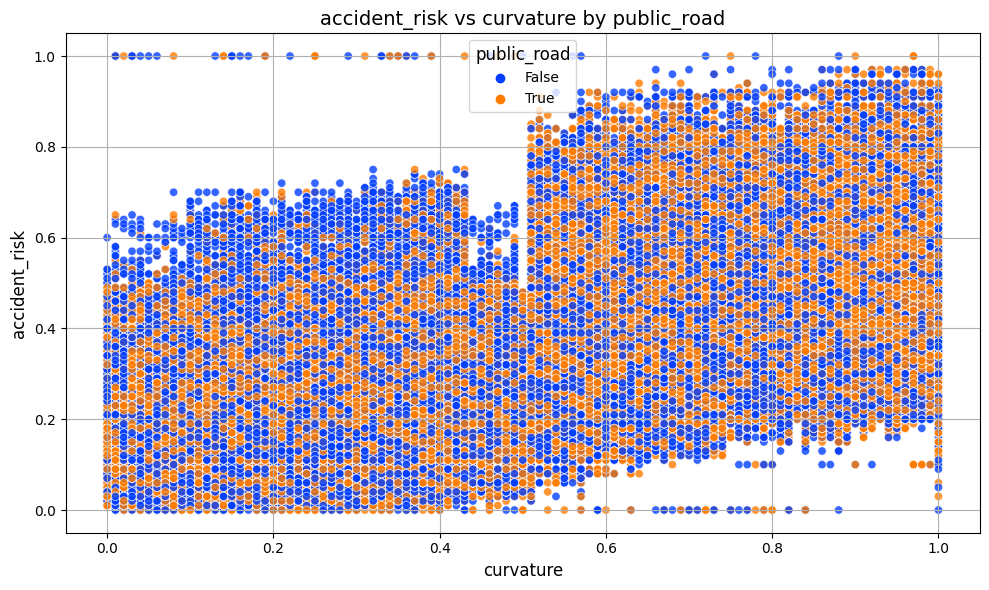

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['public_road'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by public_road', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='public_road', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

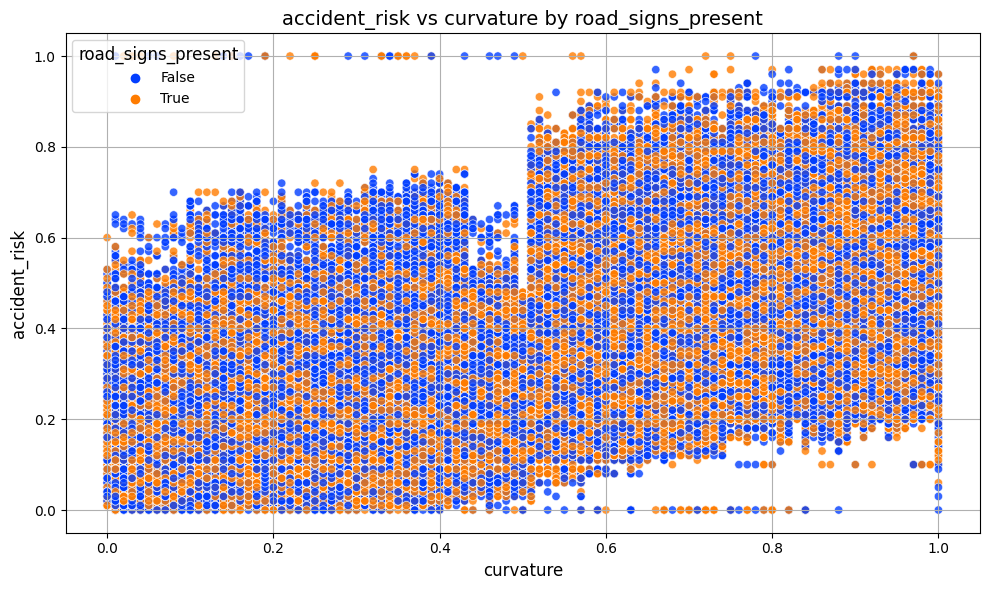

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['road_signs_present'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by road_signs_present', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='road_signs_present', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

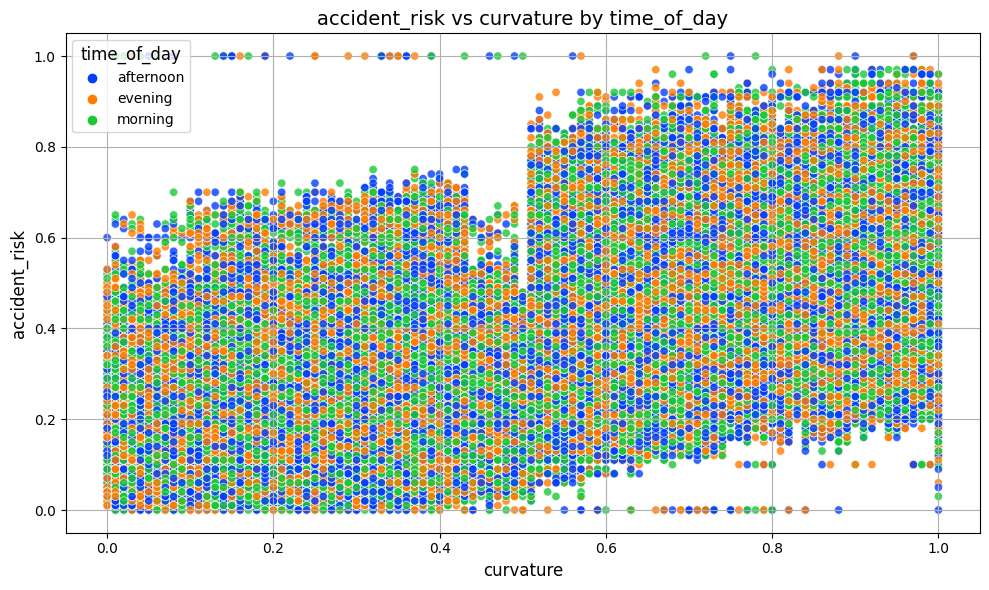

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['time_of_day'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by time_of_day', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='time_of_day', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipykernel_36/3718184008.py:17: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


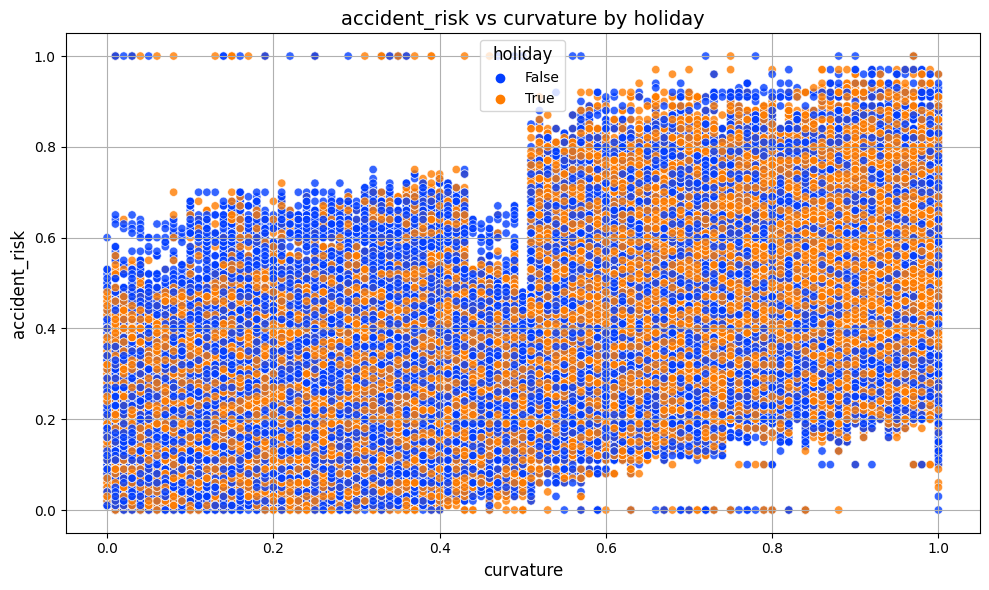

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['holiday'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by holiday', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='holiday', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipykernel_36/3470129015.py:17: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


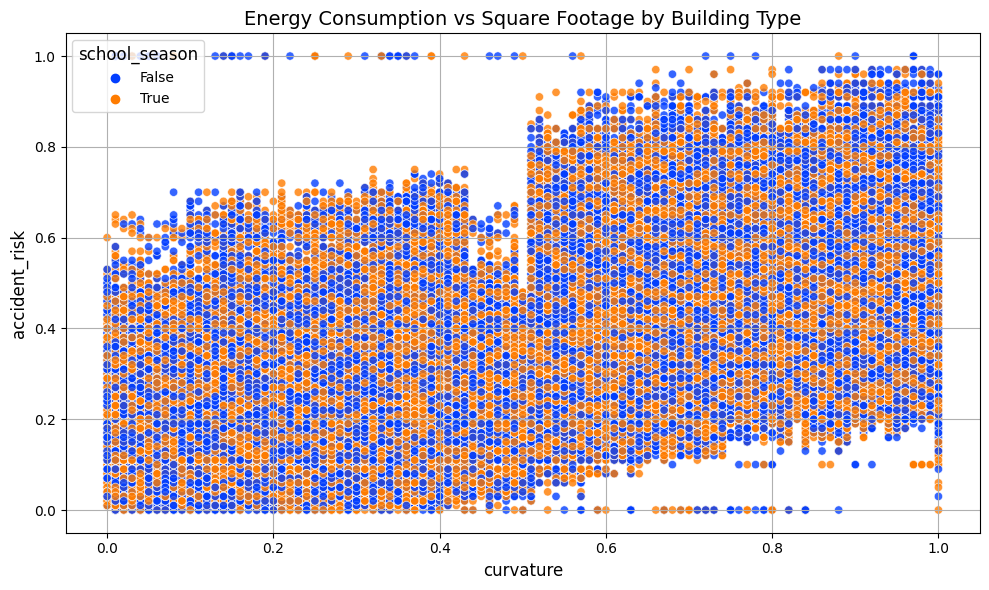

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['school_season'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by school_season', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='school_season', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipykernel_36/1174026509.py:17: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


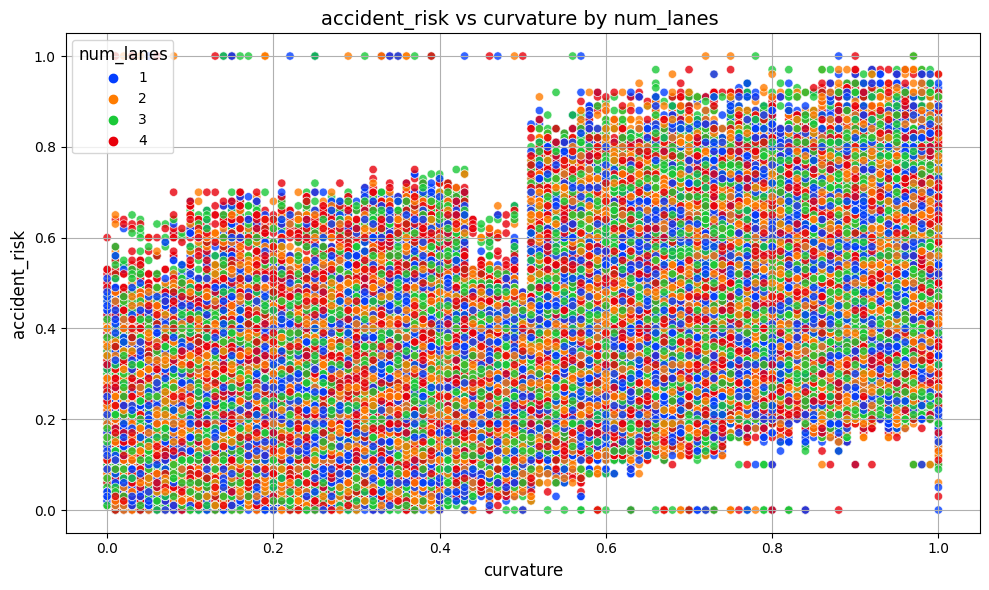

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['num_lanes'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by num_lanes ', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='num_lanes', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipykernel_36/3177953404.py:17: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


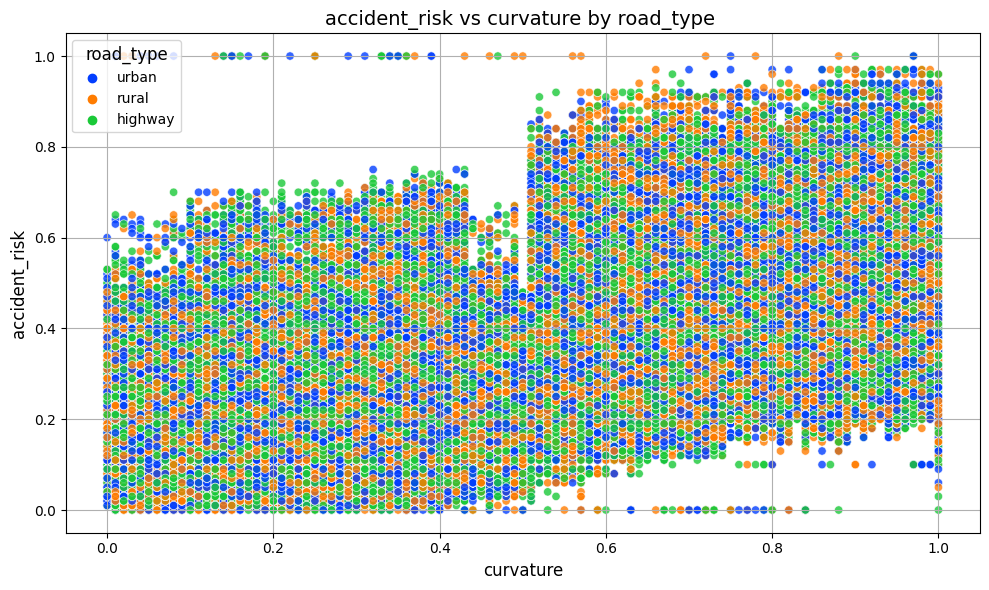

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df['curvature'],
    y=df['accident_risk'],
    hue=df['road_type'],
    palette='bright',
    alpha=0.8
)
plt.title('accident_risk vs curvature by road_type ', fontsize=14)
plt.xlabel('curvature', fontsize=12)
plt.ylabel('accident_risk', fontsize=12)
plt.legend(title='road_type', title_fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()